# Approach 1: Roads and intersections only, as one class

In [1]:
IMG_HEIGHT = 512
IMG_WIDTH = 512
IMG_CHANNELS = 3

In [2]:
import tensorflow as tf
num_classes = 1 # 0 as background and 1 as road

inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
b1 = tf.keras.layers.BatchNormalization()(c1)
r1 = tf.keras.layers.ReLU()(b1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(r1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
b2 = tf.keras.layers.BatchNormalization()(c2)
r2 = tf.keras.layers.ReLU()(b2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(r2)
 
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
b3 = tf.keras.layers.BatchNormalization()(c3)
r3 = tf.keras.layers.ReLU()(b3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(r3)
 
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
b4 = tf.keras.layers.BatchNormalization()(c4)
r4 = tf.keras.layers.ReLU()(b4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(r4)
 
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
b5 = tf.keras.layers.BatchNormalization()(c5)
r5 = tf.keras.layers.ReLU()(b5)
c5 = tf.keras.layers.Dropout(0.3)(r5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path 
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
u6 = tf.keras.layers.BatchNormalization()(u6)
u6 = tf.keras.layers.ReLU()(u6)

 
u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(u6)
u7 = tf.keras.layers.concatenate([u7, c3])
u7 = tf.keras.layers.BatchNormalization()(u7)
u7 = tf.keras.layers.ReLU()(u7)

 
u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(u7)
u8 = tf.keras.layers.concatenate([u8, c2])
u8 = tf.keras.layers.BatchNormalization()(u8)
u8 = tf.keras.layers.ReLU()(u8)
 
u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(u8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
u9 = tf.keras.layers.BatchNormalization()(u9)
u9 = tf.keras.layers.ReLU()(u9)

outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='sigmoid')(u9)

In [3]:
from my_metrics import iou_loss, dice_dice_loss
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy',
                                                                     tf.keras.metrics.binary_crossentropy,
                                                                     tf.keras.metrics.BinaryIoU(),
                                                                     tf.keras.metrics.Precision(),
                                                                     tf.keras.metrics.Recall(),
                                                                     tf.keras.metrics.FalseNegatives(),
                                                                     tf.keras.metrics.FalsePositives(),
                                                                     tf.keras.metrics.TruePositives(),
                                                                     tf.keras.metrics.TrueNegatives()
                                                                     ])

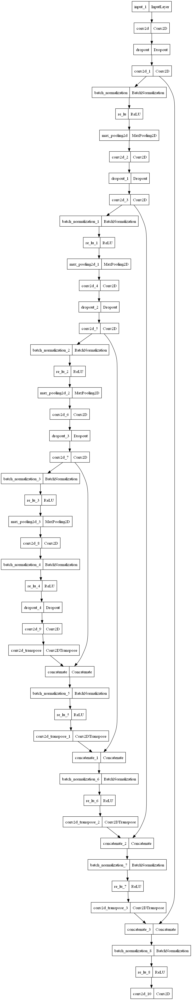

In [4]:
tf.keras.utils.plot_model(model, "model.png")

In [5]:
%load_ext autoreload
%autoreload 2
import tensorflow as tf
import rasterio
import numpy as np
import os
import matplotlib.pyplot as plt
import random
from helpers import show_image_from_np


seed = 42
tf.random.set_seed(seed)
epochs = 10


def read_files():
    def _gen():
        tile_directory = '../data/tiles'
        photos_dir = os.path.join(tile_directory, 'photos')
        masks_dir = os.path.join(tile_directory, 'masks')

        photo_files = os.listdir(photos_dir)
        mask_files = os.listdir(masks_dir)
        # number of samples as fraction of the whole dataset
        num_samples = int(len(photo_files) * 0.05)

        photo_files_subset = photo_files[:num_samples]
        mask_files_subset = mask_files[:num_samples]

        for photo_path, mask_path in zip(photo_files_subset, mask_files_subset):
            with rasterio.open(os.path.join(photos_dir, photo_path)) as photo_ds:
                photo = np.transpose(photo_ds.read([1, 2, 3]), (1, 2, 0))

            with rasterio.open(os.path.join(masks_dir, mask_path)) as mask_ds:
                mask = mask_ds.read(1)
                mask = mask.astype('int32')

            yield photo, mask
    return _gen


def preprocess_image(photo, mask):
    photo = tf.image.resize(photo, [512, 512])

    mask = tf.expand_dims(mask, axis=-1)
    mask = tf.image.resize(mask, [512, 512])
    mask = tf.cast(mask, tf.int32)
    mask = tf.where(mask==5, 4, mask)  # Set Intersection to Road
    mask = tf.where(mask==4, 4, 0)  # Set Anything other than Road to 0
    mask = tf.where(mask==4, 1, mask)  # Finally set Road to 1 (binary segmentation as of now)

    return photo, mask

def skip_condition(photo, mask):
    # Skip samples that are have labels greater than 10 or no labels at all
    max_value = tf.reduce_max(mask)
    less = tf.less(max_value, 11)
    greater = tf.greater(max_value, 0)
    return tf.logical_and(less, greater)

def normalize_input(photo, mask):
    photo = tf.cast(photo, tf.float32)
    photo = photo/255.
    return photo, mask


output_signature = (
    tf.TensorSpec(shape=(2048, 2048, 3), dtype=tf.int32),
    tf.TensorSpec(shape=(2048, 2048), dtype=tf.int32)
)

dataset = tf.data.Dataset.from_generator(read_files(), output_signature=output_signature)
dataset = dataset.shuffle(buffer_size=10)
dataset = dataset.map(preprocess_image)
dataset = dataset.filter(skip_condition)
dataset = dataset.map(normalize_input)

total_samples = dataset.reduce(np.int32(0), lambda x, _: x + 1).numpy()
print(total_samples)
train_samples = int(total_samples * 0.7)
test_samples = int(total_samples * 0.2)
val_samples = int(total_samples * 0.1)

train_dataset = dataset.take(train_samples)
test_dataset = dataset.skip(train_samples).take(test_samples)
val_dataset = dataset.skip(train_samples).skip(test_samples).take(val_samples)


train_dataset = train_dataset.batch(4)
train_dataset = train_dataset.repeat(epochs)

test_dataset = test_dataset.batch(1)
val_dataset = val_dataset.repeat(epochs)
val_dataset = val_dataset.batch(4)

hist = model.fit(train_dataset, validation_data=val_dataset, epochs=epochs)

Epoch 1/10
580/580 [==============================] - 266s 446ms/step - loss: 0.1878 - accuracy: 0.9383 - binary_crossentropy: 0.1878 - binary_io_u: 0.7391 - precision: 0.7191 - recall: 0.6922 - false_negatives: 19814680.0000 - false_positives: 17408392.0000 - true_positives: 44556036.0000 - true_positives_1: 44556036.0000
Epoch 2/10
580/580 [==============================] - 261s 451ms/step - loss: 0.0631 - accuracy: 0.9765 - binary_crossentropy: 0.0631 - binary_io_u: 0.8872 - precision: 0.8968 - recall: 0.8816 - false_negatives: 7624422.0000 - false_positives: 6529866.0000 - true_positives: 56746280.0000 - true_positives_1: 56746280.0000
Epoch 3/10
580/580 [==============================] - 261s 450ms/step - loss: 0.0348 - accuracy: 0.9868 - binary_crossentropy: 0.0348 - binary_io_u: 0.9345 - precision: 0.9390 - recall: 0.9374 - false_negatives: 4026560.0000 - false_positives: 3917109.0000 - true_positives: 60344184.0000 - true_positives_1: 60344184.0000
Epoch 4/10
580/580 [=========

In [6]:
model.save('./models/dice_loss_02.h5')

In [7]:
hist.history

{'loss': [0.18776704370975494,
  0.06308555603027344,
  0.03478001430630684,
  0.020275359973311424,
  0.015734929591417313,
  0.012033773586153984,
  0.010458244942128658,
  0.01609848067164421,
  0.008924920111894608,
  0.008775580674409866],
 'accuracy': [0.9382628798484802,
  0.976524293422699,
  0.9868254065513611,
  0.9921131134033203,
  0.9937314391136169,
  0.9951153993606567,
  0.9957109689712524,
  0.9937544465065002,
  0.9963210225105286,
  0.9963680505752563],
 'binary_crossentropy': [0.18776704370975494,
  0.06308555603027344,
  0.03478001430630684,
  0.020275359973311424,
  0.015734929591417313,
  0.012033773586153984,
  0.010458244942128658,
  0.01609848067164421,
  0.008924920111894608,
  0.008775580674409866],
 'binary_io_u': [0.7390854358673096,
  0.8872246742248535,
  0.9345166683197021,
  0.959989070892334,
  0.967994213104248,
  0.9749189615249634,
  0.9779195785522461,
  0.9680863618850708,
  0.9810128211975098,
  0.9812494516372681],
 'precision': [0.719058275222

In [8]:
preds = model.predict(test_dataset)

57/57 [==============================] - 4s 31ms/step


In [9]:
preds.shape

(57, 512, 512, 1)

In [10]:
preds[0].shape

(512, 512, 1)

In [11]:
np.amax(preds)

1.0

In [12]:
newmasks = np.where(preds>0.5, 4, 0)

In [13]:
newmasks.shape

(57, 512, 512, 1)

In [14]:
np.unique(newmasks)

array([0, 4])

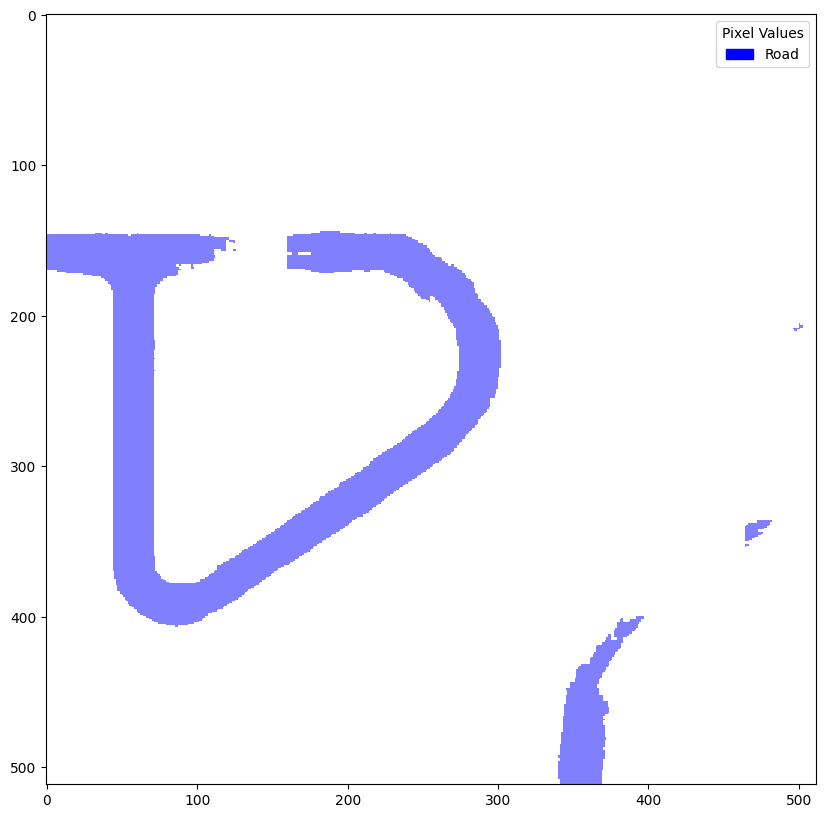

In [15]:
show_image_from_np(mask=newmasks[0])

In [16]:
testdata = test_dataset.take(10)
# traindata = train_dataset.take(5)
# preds2 = model.predict(traindata)
# newmasks2 = np.where(preds2>0.4, 1, 0)

In [17]:
unbatched = [(x.numpy()*255,y.numpy()) for x,y in testdata.unbatch()]

In [18]:
len(unbatched)

10

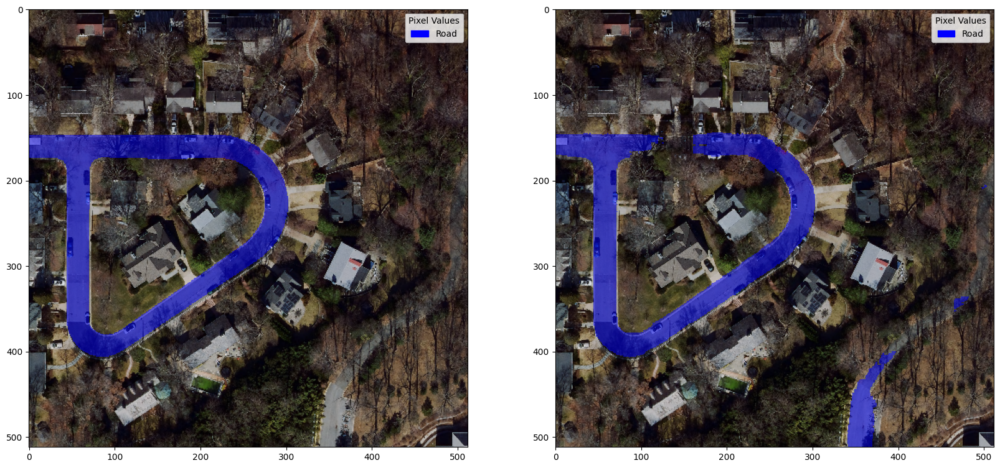

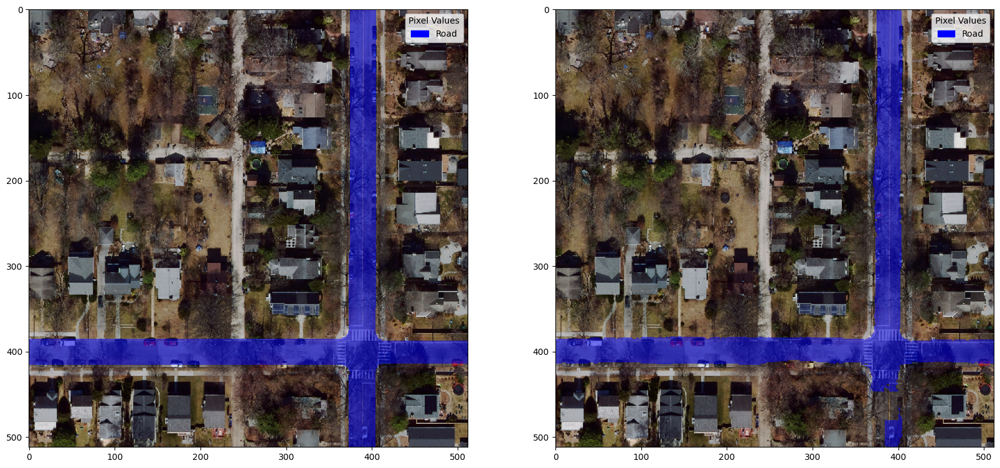

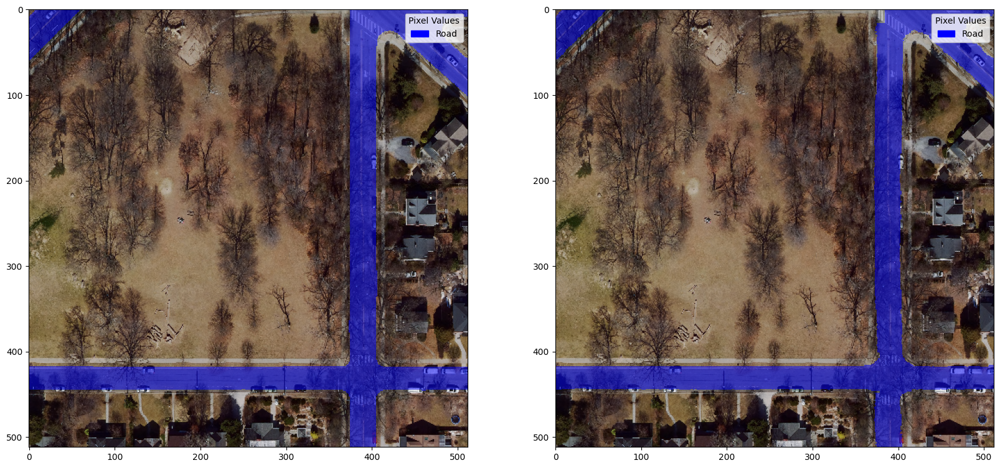

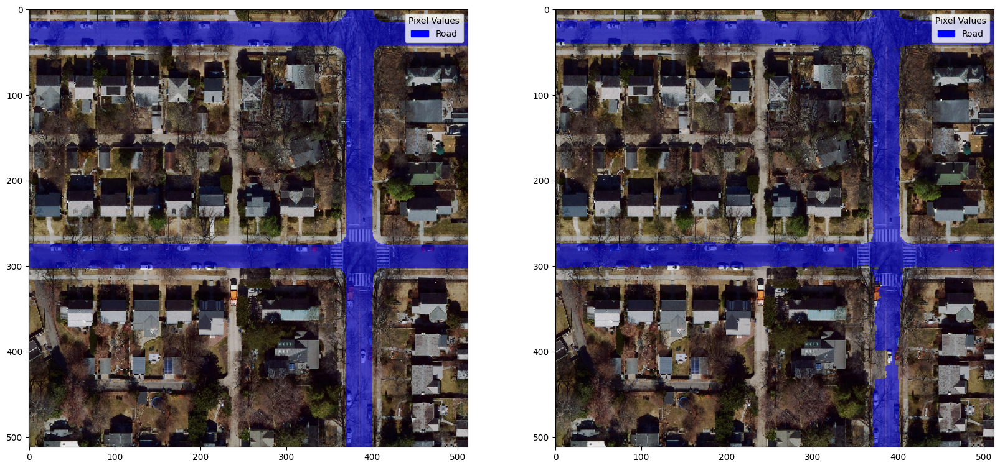

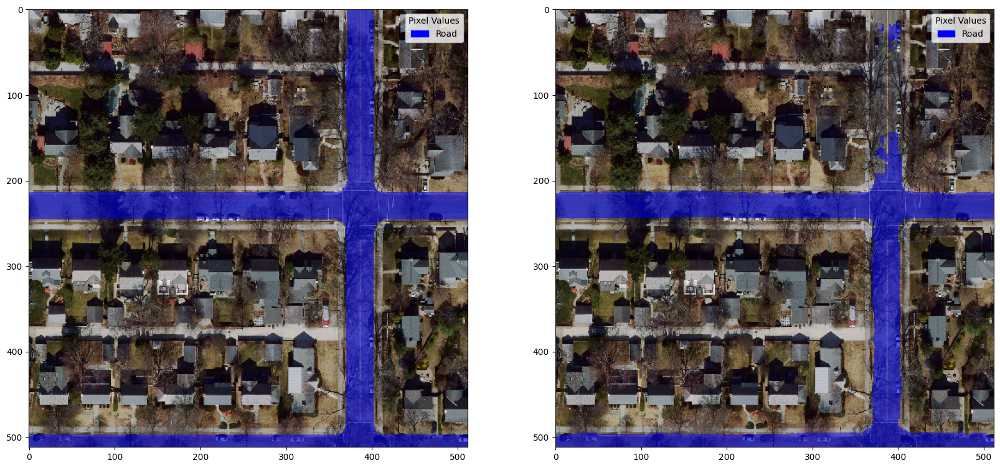

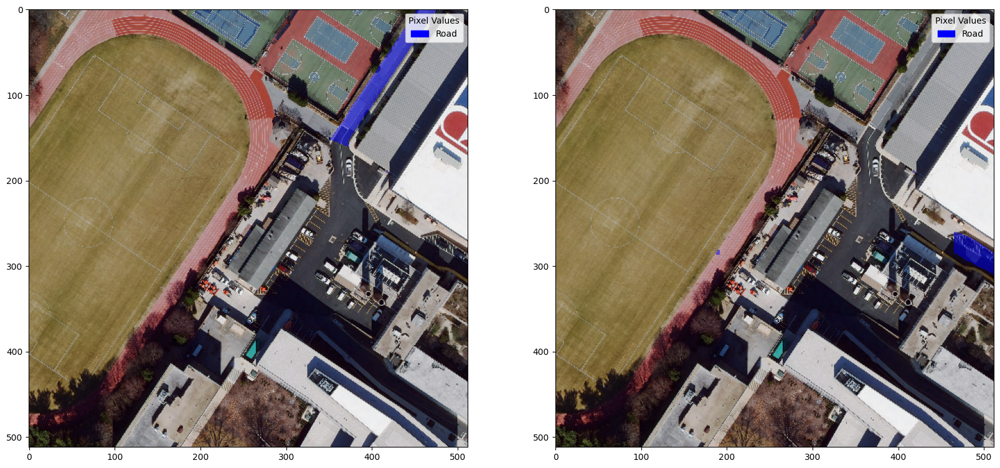

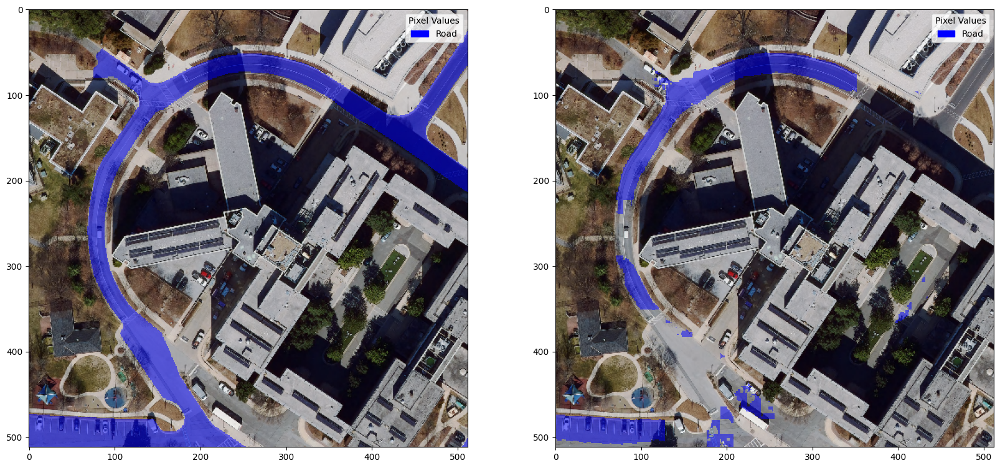

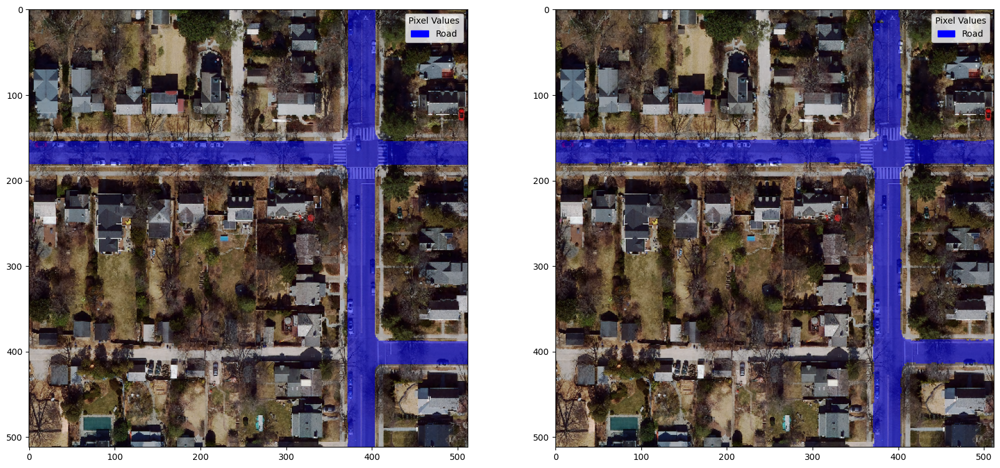

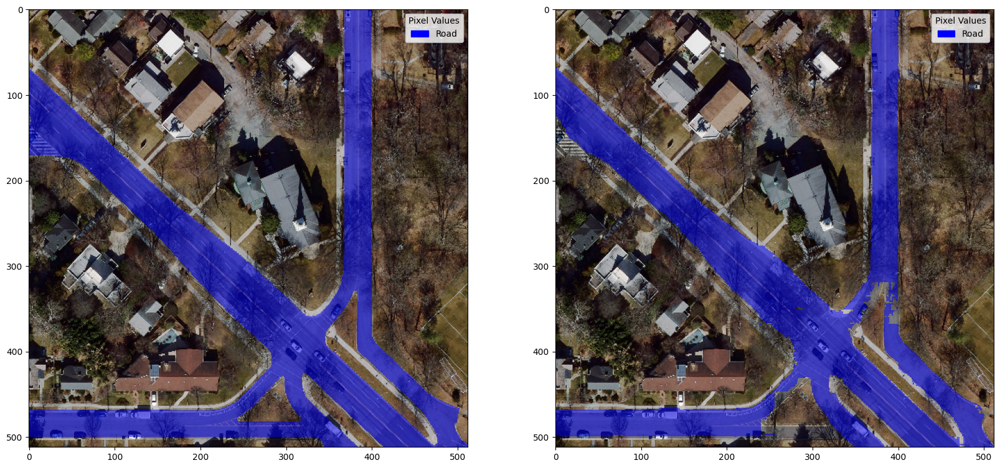

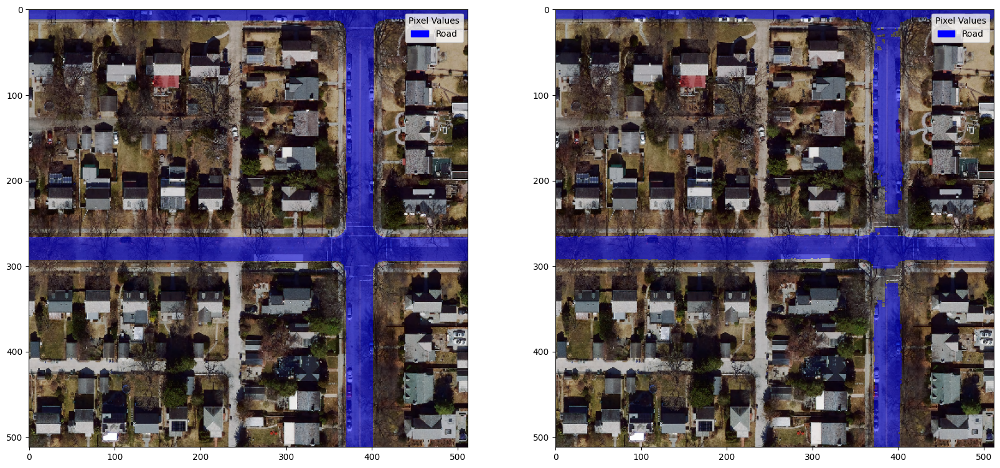

In [19]:
from helpers import compare_predicted_mask
for (photo, mask), pred in zip(unbatched[:10], newmasks):
    # show_image_from_np(photo, pred)
    compare_predicted_mask(photo, np.where(mask==1, 4, mask), pred)

In [20]:
import pickle

a = {'hello': 'world'}

with open('history_cross.pickle', 'wb') as handle:
    pickle.dump(hist.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

# with open('filename.pickle', 'rb') as handle:
#     b = pickle.load(handle)



In [21]:
import pickle

with open('history_cross.pickle', 'rb') as handle:
    history_dice_dice = pickle.load(handle)

history_dice_dice

{'loss': [0.18776704370975494,
  0.06308555603027344,
  0.03478001430630684,
  0.020275359973311424,
  0.015734929591417313,
  0.012033773586153984,
  0.010458244942128658,
  0.01609848067164421,
  0.008924920111894608,
  0.008775580674409866],
 'accuracy': [0.9382628798484802,
  0.976524293422699,
  0.9868254065513611,
  0.9921131134033203,
  0.9937314391136169,
  0.9951153993606567,
  0.9957109689712524,
  0.9937544465065002,
  0.9963210225105286,
  0.9963680505752563],
 'binary_crossentropy': [0.18776704370975494,
  0.06308555603027344,
  0.03478001430630684,
  0.020275359973311424,
  0.015734929591417313,
  0.012033773586153984,
  0.010458244942128658,
  0.01609848067164421,
  0.008924920111894608,
  0.008775580674409866],
 'binary_io_u': [0.7390854358673096,
  0.8872246742248535,
  0.9345166683197021,
  0.959989070892334,
  0.967994213104248,
  0.9749189615249634,
  0.9779195785522461,
  0.9680863618850708,
  0.9810128211975098,
  0.9812494516372681],
 'precision': [0.719058275222